# Lab 4: Multi-Label Classification of Satellite Photos of the Amazon Rainforest

Name: **Krish Agarwal** <br>
Reg No: **21112016** <br>
Class: **5BSc DS A** <br>
Date: 10/10/2023

---------------

## `Objective`: 
1. Applying image processing steps to satellite photos to enhance the qulaity of the image  
1. Training a model to classify the processed satellite photos into their respective label classes.

## `Theory`:  
  
### About the Planet Dataset:
The "Planet: Understanding the Amazon from Space" competition was held on Kaggle in 2017.  
The competition involved classifying small squares of satellite images taken from space of the Amazon rainforest in Brazil in terms of 17 classes, such as "agriculture", "clear", and "water". Given the name of the competition, the dataset is often referred to simply as the "Planet dataset".  
The color images were provided in both TIFF and JPEG format with the size 256×256 pixels. A total of 40,779 images were provided in the training dataset and 40,669 images were provided in the test set for which predictions were required.  

### Procedure:  
The problem is an example of a multi-label image classification task, where one or more class labels must be predicted for each label. This is different from multi-class classification, where each image is assigned one from among many classes.  
The multiple class labels were provided for each image in the training dataset with an accompanying file that mapped the image filename to the string class labels.

## `Reference`:  
1. **Kaggle (Dataset)**: https://www.kaggle.com/c/planet-understanding-the-amazon-from-space
1. **Machine Learning Master (Reference Article)**: https://machinelearningmastery.com/how-to-develop-a-convolutional-neural-network-to-classify-satellite-photos-of-the-amazon-rainforest/

## `Code`:

In [1]:
# importing all the neccessary libraries/modules
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import numpy as np

In [2]:
# Reading the labels
labels_df = pd.read_csv("D:/Z/Downloads/train_v2.csv")
labels_df.head()
 
# Extracting the labels for the first 500 images
labels = labels_df['tags'][:500].tolist()

# Loading images
image_files = [f"D:/Z/Downloads/train-jpg/train_{i}.jpg" for i in range(500)] # loading only 500 images
images = [cv2.imread(image_file) for image_file in image_files]
images_rgb = [cv2.cvtColor(img, cv2.COLOR_BGR2RGB) for img in images]

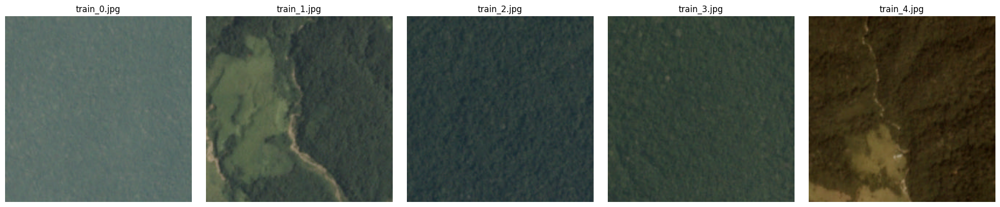

In [3]:
# Displaying the first 5 images
fig, axes = plt.subplots(1, 5, figsize=(20, 4))
for ax, img, name in zip(axes, images_rgb, image_files):
    ax.imshow(img)
    ax.set_title(name.split('/')[-1])
    ax.axis('off')

plt.tight_layout()
plt.show()

## Processing the labels

**One-hot encoding**

In [4]:
from sklearn.preprocessing import MultiLabelBinarizer

# Splitting the labels by space to get individual tags
split_labels = [tags.split(' ') for tags in labels]

In [5]:
# Using MultiLabelBinarizer to one-hot encode the labels
mlb = MultiLabelBinarizer()
labels_encoded = mlb.fit_transform(split_labels)

# Displaying the encoded labels and the corresponding classes
encoded_sample = labels_encoded[:10]  # First 10 for preview
classes = mlb.classes_

In [6]:
print(encoded_sample, "\n", classes)

[[0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0]
 [1 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 1]
 [0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0]
 [0 0 0 0 0 1 0 0 0 0 0 0 1 0 0 0 0]
 [1 0 0 0 0 1 0 0 0 1 0 0 1 1 0 0 0]
 [0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 1]
 [1 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 1]
 [0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 0]
 [1 0 0 0 0 1 0 0 1 0 0 0 1 0 0 0 0]
 [1 0 0 0 0 1 0 0 1 0 0 0 1 1 0 0 0]] 
 ['agriculture' 'artisinal_mine' 'bare_ground' 'blooming' 'blow_down'
 'clear' 'cloudy' 'conventional_mine' 'cultivation' 'habitation' 'haze'
 'partly_cloudy' 'primary' 'road' 'selective_logging' 'slash_burn' 'water']


## Image Processing

**Hostogram Equalization**

In [7]:
def equalize_histogram_color(img):
    channels = cv2.split(img) # Splitting the image into its color channels
    eq_channels = [cv2.equalizeHist(channel) for channel in channels] # Equalizing the histogram of each channel
    eq_image = cv2.merge(eq_channels) # Merging the channels back
    return eq_image

In [8]:
# Applying histogram equalization
equalized_images = [equalize_histogram_color(img) for img in images]

**Gaussian Blur**

In [9]:
# Applying Gaussian blur for noise reduction
blurred_images = [cv2.GaussianBlur(eq_img, (5, 5), 0) for eq_img in equalized_images]

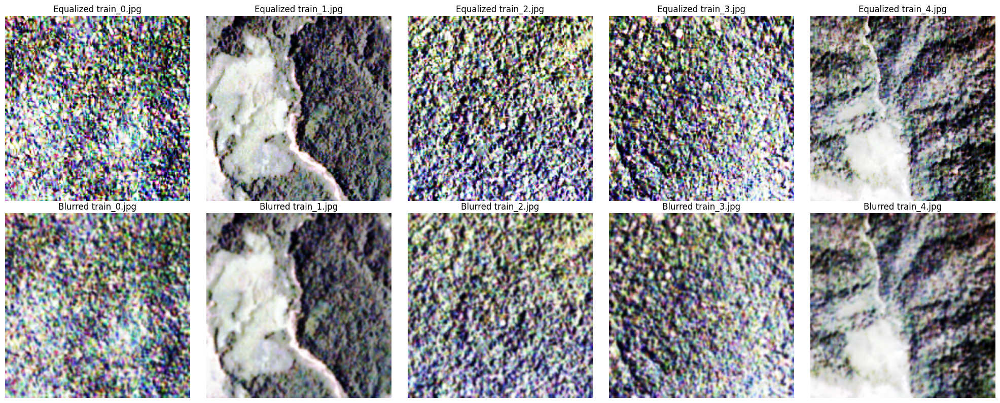

In [10]:
# Displaying the processed images
fig, axes = plt.subplots(2, 5, figsize=(20, 8))

for ax, img, name in zip(axes[0], equalized_images, image_files):
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax.set_title(f"Equalized {name.split('/')[-1]}")
    ax.axis('off')

for ax, img, name in zip(axes[1], blurred_images, image_files):
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax.set_title(f"Blurred {name.split('/')[-1]}")
    ax.axis('off')

plt.tight_layout()
plt.show()

**Morphological Processes**  
- **Erosion**
- **Dilation**
- **Opening**
- **Closing**

In [11]:
# Defining a kernel for the morphological operations
kernel = np.ones((5,5), np.uint8)

# Applying morphological operations
eroded_images = [cv2.erode(img, kernel, iterations=1) for img in blurred_images]
dilated_images = [cv2.dilate(img, kernel, iterations=1) for img in blurred_images]
opened_images = [cv2.morphologyEx(img, cv2.MORPH_OPEN, kernel) for img in blurred_images]
closed_images = [cv2.morphologyEx(img, cv2.MORPH_CLOSE, kernel) for img in blurred_images]

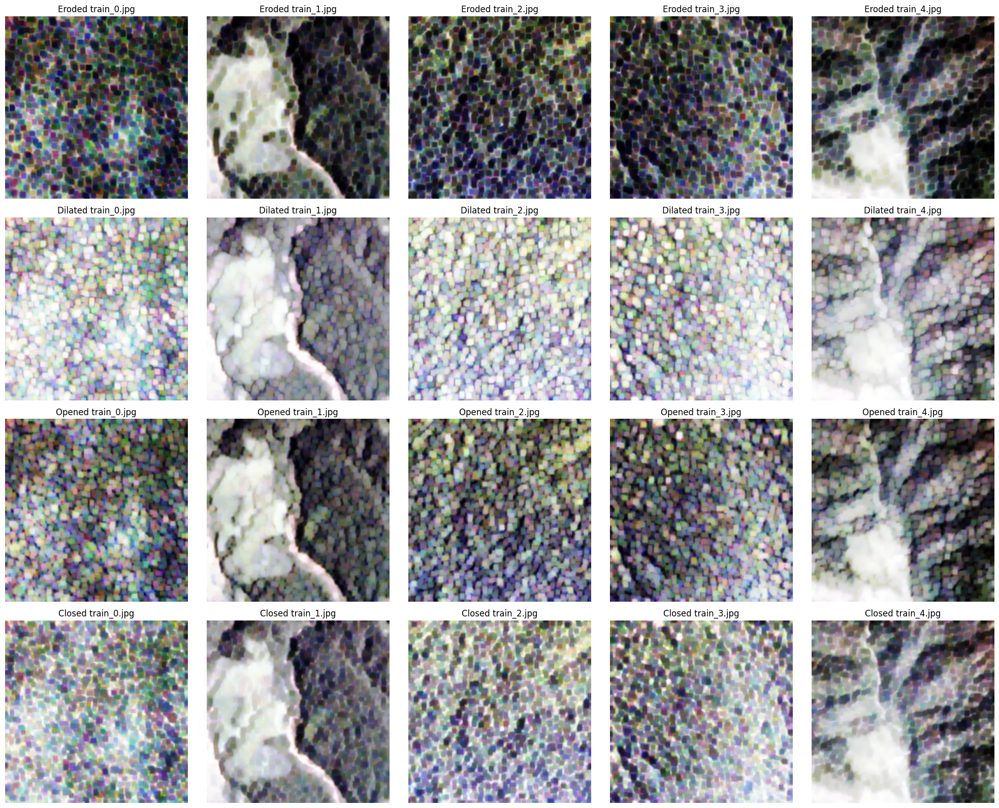

In [12]:
# Displaying the processed images
fig, axes = plt.subplots(4, 5, figsize=(20, 16))

for ax, img, name in zip(axes[0], eroded_images, image_files):
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax.set_title(f"Eroded {name.split('/')[-1]}")
    ax.axis('off')

for ax, img, name in zip(axes[1], dilated_images, image_files):
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax.set_title(f"Dilated {name.split('/')[-1]}")
    ax.axis('off')
    
for ax, img, name in zip(axes[2], opened_images, image_files):
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax.set_title(f"Opened {name.split('/')[-1]}")
    ax.axis('off')
    
for ax, img, name in zip(axes[3], closed_images, image_files):
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax.set_title(f"Closed {name.split('/')[-1]}")
    ax.axis('off')

plt.tight_layout()
plt.show()

**Edge Detection**

In [13]:
# Apply Canny edge detection
edge_detected_images = [cv2.Canny(img, 100, 200) for img in blurred_images]

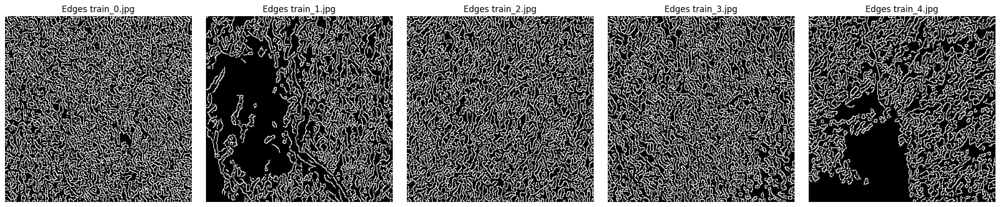

In [14]:
# Displaying the edge detected images
fig, axes = plt.subplots(1, 5, figsize=(20, 4))

for ax, img, name in zip(axes, edge_detected_images, image_files):
    ax.imshow(img, cmap='gray')
    ax.set_title(f"Edges {name.split('/')[-1]}")
    ax.axis('off')

plt.tight_layout()
plt.show()

**Normalization**

In [15]:
# Normalizing the images to range [0, 1]
normalized_images = [img.astype(np.float32) / 255.0 for img in blurred_images]

<hr>

## Model Training

In [17]:
# importing all the necessary libraries/modules
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout

In [19]:
# Defining the CNN model
def createCnnModel(input_shape, num_classes):
    model = Sequential()

    # Convolutional layers
    model.add(Conv2D(32, (3, 3), activation='relu', input_shape=input_shape))
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Conv2D(128, (3, 3), activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2)))

    # Fully connected layers
    model.add(Flatten())
    model.add(Dense(512, activation='relu'))
    model.add(Dropout(0.5))
    
    # Output layer
    model.add(Dense(num_classes, activation='sigmoid'))

    return model

In [20]:
# Creating the model
input_shape = normalized_images[0].shape
num_classes = len(classes)

model = createCnnModel(input_shape, num_classes)

# Compiling the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Display the model summary
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 254, 254, 32)      896       
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 127, 127, 32)      0         
 g2D)                                                            
                                                                 
 conv2d_4 (Conv2D)           (None, 125, 125, 64)      18496     
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 62, 62, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_5 (Conv2D)           (None, 60, 60, 128)       73856     
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 30, 30, 128)      

<hr>